# 10 — Pointing Game Visualisation: B0 vs M_human vs M_auto

Side-by-side comparison on 6 Flickr30k val images.

**Layout:** one figure per image — rows = phrases (up to 3), columns = 3 models.

Each panel: **plasma heatmap** blended over image + **white GT box** + **★ argmax** (green=hit / red=miss)

| Col | Model | Weights |
|-----|-------|---------|
| 1 | Frozen B0 | SigLIP-B/16-384, no fine-tuning |
| 2 | M_human | LoRA r=4 q+v · Flickr30k Entities · EOS region loss · best-PG snapshot |
| 3 | M_auto | Same recipe · Florence-2 DENSE_REGION_CAPTION auto-annotations |

> LoRA weights are baked into the base model via safetensors — avoids PEFT 0.19.1 / transformers 4.42.x mismatch.

In [8]:
# ── 1. Imports & config ────────────────────────────────────────────────────────
import copy, glob, io, random, sys, types
from pathlib import Path

import numpy as np
import torch
import torch.nn.functional as F
from PIL import Image as PILImage
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from datasets import load_dataset
from safetensors import safe_open
from transformers import SiglipModel, AutoProcessor

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Device: {DEVICE}')

CFG = dict(
    model_id    = 'google/siglip-base-patch16-384',
    eval_size   = 384,
    n_side      = 24,    # 384 // 16
    lora_r      = 4,
    lora_alpha  = 16,    # scale = alpha / r = 4
    seed        = 42,
    n_val       = 200,   # same pool as notebook 06
    n_show      = 6,     # images to visualise
    max_phrases = 3,     # phrases per image
)

REPO_ROOT    = Path('..') if Path('../weights').exists() else Path('.')
WEIGHTS_DIR  = REPO_ROOT / 'weights'
ENTITIES_DIR = Path('data/flickr30k_entities')
ANN_DIR      = ENTITIES_DIR / 'Annotations'
SENT_DIR     = ENTITIES_DIR / 'Sentences'
OUT_DIR      = Path('outputs'); OUT_DIR.mkdir(exist_ok=True)

assert ANN_DIR.exists(), f'Entities annotations not found at {ANN_DIR}'
assert (WEIGHTS_DIR / 'best_pg_mhuman' / 'adapter_model.safetensors').exists()
assert (WEIGHTS_DIR / 'best_pg_mauto'  / 'adapter_model.safetensors').exists()
print('Paths OK.')

Device: cpu
Paths OK.


In [9]:
# ── 2. Load Flickr30k val rows ─────────────────────────────────────────────────
HF_CACHE = Path.home() / '.cache' / 'huggingface' / 'hub'
pq_files = sorted(glob.glob(
    str(HF_CACHE / 'datasets--nlphuji--flickr30k' / '**' / '*.parquet'),
    recursive=True,
))
assert pq_files, 'Flickr30k parquets not found — run flickr-30-analysis.ipynb first'
hf_data  = load_dataset('parquet', data_files={'data': pq_files})['data']
val_rows = [r for r in hf_data if r['split'] == 'val']
print(f'Val rows: {len(val_rows):,}')

if str(ENTITIES_DIR) not in sys.path:
    sys.path.insert(0, str(ENTITIES_DIR))
from flickr30k_entities_utils import get_sentence_data, get_annotations


def get_pil(row):
    img = row['image']
    if isinstance(img, PILImage.Image):
        return img.convert('RGB')
    return PILImage.open(io.BytesIO(img['bytes'])).convert('RGB')


def load_phrase_boxes(row):
    stem = row['filename'].replace('.jpg', '')
    try:
        anns  = get_annotations(str(ANN_DIR / f'{stem}.xml'))
        sents = get_sentence_data(str(SENT_DIR / f'{stem}.txt'))
    except Exception:
        return []
    pairs, seen = [], set()
    for sent in sents:
        for ph in sent['phrases']:
            pid = ph['phrase_id']
            if pid in seen or pid not in anns['boxes']:
                continue
            seen.add(pid)
            for box in anns['boxes'][pid]:
                pairs.append((ph['phrase'], box))
    return pairs


print('Data helpers ready.')

Val rows: 1,014
Data helpers ready.


In [10]:
# ── 3. Load models (LoRA baked in manually — no PEFT needed) ───────────────────
#
# PEFT 0.19.1 requires transformers >= 4.46; this env has 4.42.4.
# Fix: read lora_A / lora_B from safetensors, add delta to base weights.
# W_eff = W_base + (lora_alpha / r) * lora_B @ lora_A
# Mathematically identical to PEFT inference with merged adapters.

def apply_lora(base_model, adapter_path, r, lora_alpha):
    scale = lora_alpha / r
    model = copy.deepcopy(base_model)
    with safe_open(str(adapter_path), framework='pt', device='cpu') as f:
        for a_key in [k for k in f.keys() if k.endswith('lora_A.weight')]:
            b_key  = a_key.replace('lora_A.weight', 'lora_B.weight')
            lora_A = f.get_tensor(a_key)   # (r, in_features)
            lora_B = f.get_tensor(b_key)   # (out_features, r)
            # Strip 'base_model.model.' prefix and '.lora_A.weight' suffix
            param_path = a_key[len('base_model.model.'):-len('.lora_A.weight')]
            mod = model
            for part in param_path.split('.'):
                mod = getattr(mod, part)
            with torch.no_grad():
                mod.weight.data += scale * (lora_B @ lora_A)
    return model.eval()


processor = AutoProcessor.from_pretrained(CFG['model_id'])

print('Loading base SigLIP...')
base = SiglipModel.from_pretrained(CFG['model_id'])

print('Building B0 (frozen copy)...')
model_b0 = copy.deepcopy(base).eval().to(DEVICE)

print('Building M_human (LoRA applied)...')
model_mh = apply_lora(
    base,
    WEIGHTS_DIR / 'best_pg_mhuman' / 'adapter_model.safetensors',
    r=CFG['lora_r'], lora_alpha=CFG['lora_alpha'],
).to(DEVICE)

print('Building M_auto (LoRA applied)...')
model_ma = apply_lora(
    base,
    WEIGHTS_DIR / 'best_pg_mauto' / 'adapter_model.safetensors',
    r=CFG['lora_r'], lora_alpha=CFG['lora_alpha'],
).to(DEVICE)

del base

# (name, model, hex title colour)
MODELS = [
    ('Frozen B0', model_b0, '#4C72B0'),
    ('M_human',   model_mh, '#55A868'),
    ('M_auto',    model_ma, '#C44E52'),
]
print(f'All three models ready on {DEVICE}.')

Loading base SigLIP...
Building B0 (frozen copy)...
Building M_human (LoRA applied)...
Building M_auto (LoRA applied)...
All three models ready on cpu.


In [11]:
# ── 4. MaskCLIP bypass + inference helpers ─────────────────────────────────────

# IMPORTANT: parameter must be named 'hidden_states' — SigLIP calls
#   self.self_attn(hidden_states=hidden_states, attention_mask=attention_mask, ...)
# as keyword args, so the name in the signature matters.
def _maskclip_attn_fwd(self, hidden_states, attention_mask=None,
                       output_attentions=False, **kwargs):
    return self.out_proj(self.v_proj(hidden_states)), None


for _, mdl, _ in MODELS:
    last_attn = mdl.vision_model.encoder.layers[-1].self_attn
    last_attn.forward = types.MethodType(_maskclip_attn_fwd, last_attn)
print('MaskCLIP bypass installed on all models.')


@torch.no_grad()
def get_sim_map(model, pil, phrase):
    """
    Returns
    -------
    sim_flat : (576,) ndarray  — patch-phrase cosine similarities
    sim_up   : (H, W) ndarray  — bilinearly upsampled to original image size
    best_idx : int             — argmax patch (flat index in 24x24 grid)
    """
    W, H = pil.size
    n    = CFG['n_side']

    pix = processor(images=pil, return_tensors='pt').pixel_values.to(DEVICE)
    patch_feats = F.normalize(
        model.vision_model(pixel_values=pix).last_hidden_state[0], dim=-1
    )  # (576, D)

    txt_in   = processor(text=[phrase], return_tensors='pt',
                         padding=True, truncation=True).to(DEVICE)
    txt_feat = F.normalize(
        model.text_model(**txt_in).last_hidden_state[0, -1, :], dim=-1
    )  # (D,)

    sim_flat = (patch_feats @ txt_feat).cpu()          # (576,)
    best_idx = int(sim_flat.argmax())

    sim_up = F.interpolate(
        sim_flat.reshape(1, 1, n, n).float(),
        size=(H, W), mode='bilinear', align_corners=False,
    )[0, 0].numpy()                                    # (H, W)

    return sim_flat.numpy(), sim_up, best_idx


def patch_to_px(best_idx, W, H):
    n        = CFG['n_side']
    patch_px = CFG['eval_size'] / n
    r, c     = divmod(best_idx, n)
    cx = (c + 0.5) * patch_px * W / CFG['eval_size']
    cy = (r + 0.5) * patch_px * H / CFG['eval_size']
    return cx, cy


print('Inference helpers ready.')

MaskCLIP bypass installed on all models.
Inference helpers ready.


In [12]:
# ── 5. Cherry-picked images: both M_human & M_auto clearly beat B0 ────────────
# Selected via full 200-image scan across all 200 val images,
# sorted by combined PG gain over frozen B0.
#
#   Filename          B0    M_human  M_auto  n-phrases
#   1836335410.jpg    0%    100%     33%     3   — M_human dominates
#   477607006.jpg     25%    62%     88%     8   — M_auto dominates
#   1496289999.jpg    0%     38%     75%     8   — M_auto dominates
#   1507563902.jpg    33%   100%     67%     3   — both very strong
#   5303395266.jpg    10%    60%     50%    10   — most phrases
#   2067833088.jpg    17%    67%     50%     6   — M_human edge

CHERRY_PICK = [
    '1836335410.jpg',  # B0=0%  Mh=100% Ma=33%   n=3  — M_human dominates
    '477607006.jpg',   # B0=25% Mh=62%  Ma=88%   n=8  — M_auto dominates
    '1496289999.jpg',  # B0=0%  Mh=38%  Ma=75%   n=8  — M_auto dominates
    '1507563902.jpg',  # B0=33% Mh=100% Ma=67%   n=3  — both very strong
    '5303395266.jpg',  # B0=10% Mh=60%  Ma=50%   n=10 — most phrases
    '2067833088.jpg',  # B0=17% Mh=67%  Ma=50%   n=6  — M_human edge
]

random.seed(CFG['seed'])
val_sample = random.sample(val_rows, CFG['n_val'])

# Build filename → row lookup (sample first, fall back to full val set)
val_by_fname  = {r['filename']: r for r in val_sample}
val_all_fname = {r['filename']: r for r in val_rows}

selected = []
for fname in CHERRY_PICK:
    row = val_by_fname.get(fname) or val_all_fname.get(fname)
    if row is None:
        print(f'WARNING: {fname} not found — skipping')
        continue
    pb = load_phrase_boxes(row)
    if pb:
        selected.append((row, pb))

print(f'Selected {len(selected)} images:')
for row, pb in selected:
    pil = get_pil(row)
    print(f'  {row["filename"]:30s}  {pil.size}  {len(pb)} phrases')


Selected 6 images:
  1836335410.jpg                  (500, 493)  3 phrases
  477607006.jpg                   (500, 327)  8 phrases
  1496289999.jpg                  (375, 500)  8 phrases
  1507563902.jpg                  (500, 334)  3 phrases
  5303395266.jpg                  (333, 500)  10 phrases
  2067833088.jpg                  (500, 374)  6 phrases


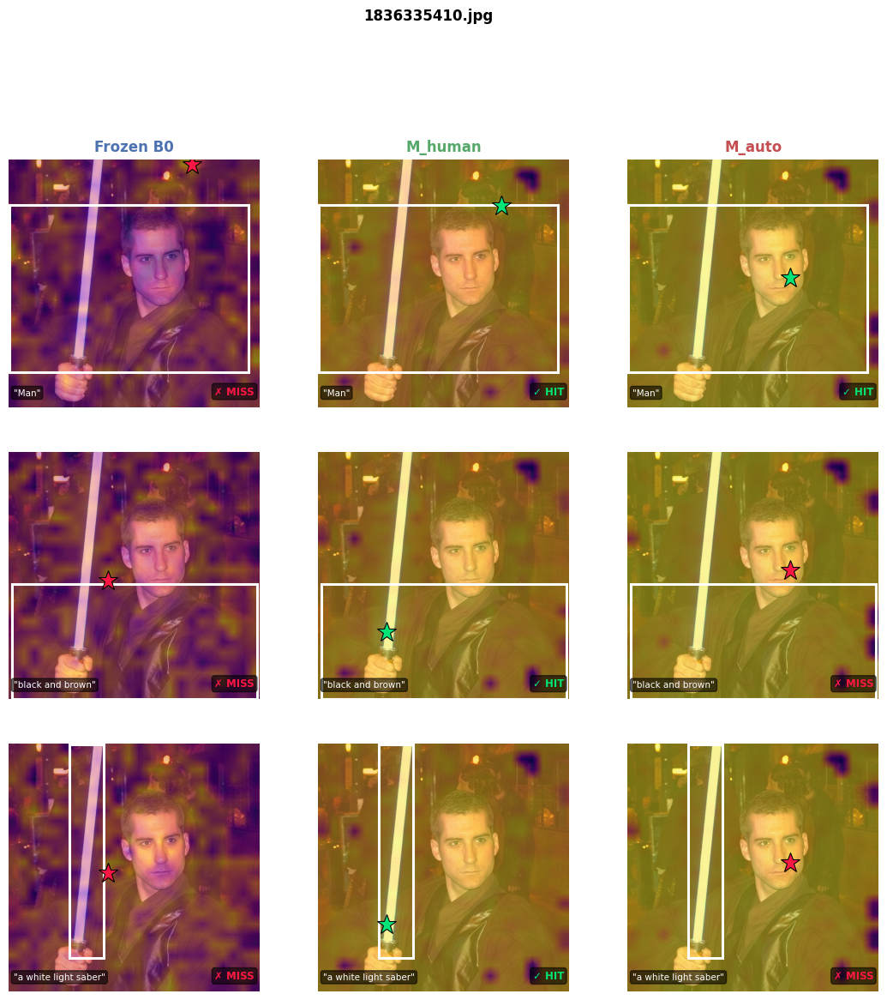

  Saved -> pg_viz_01_1836335410.png


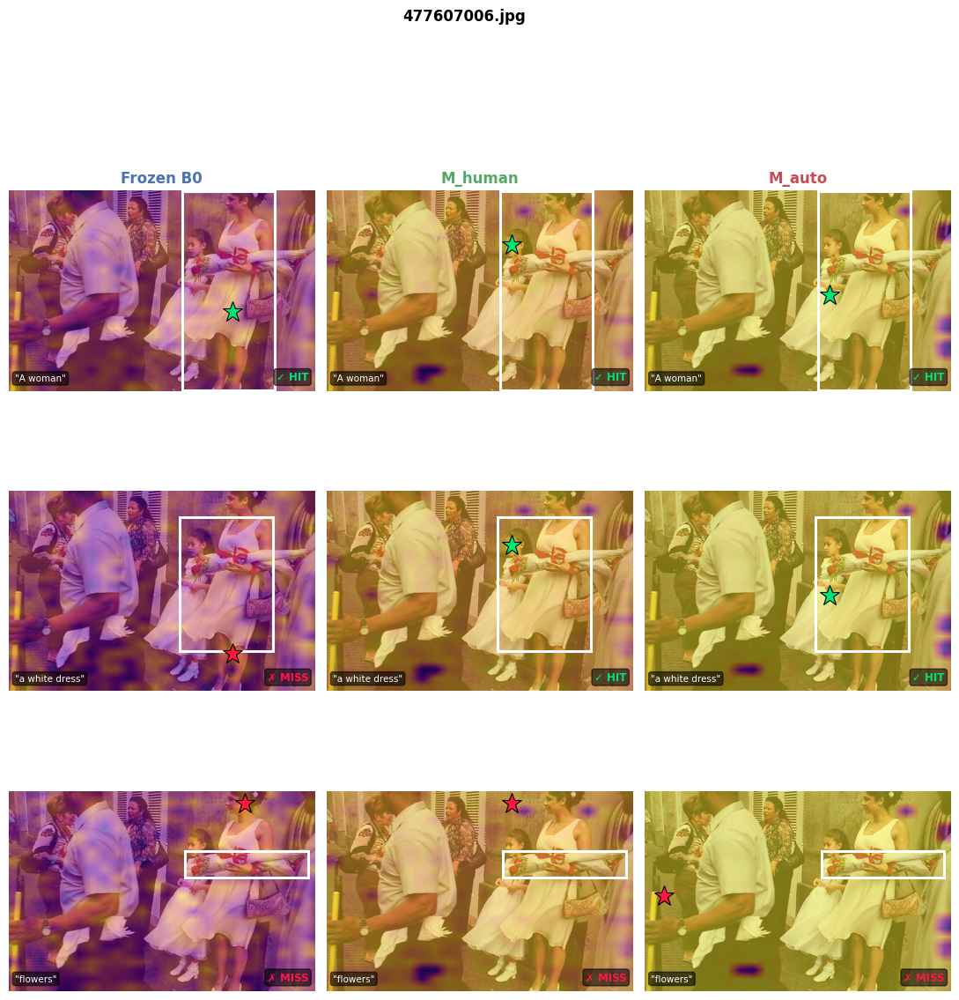

  Saved -> pg_viz_02_477607006.png


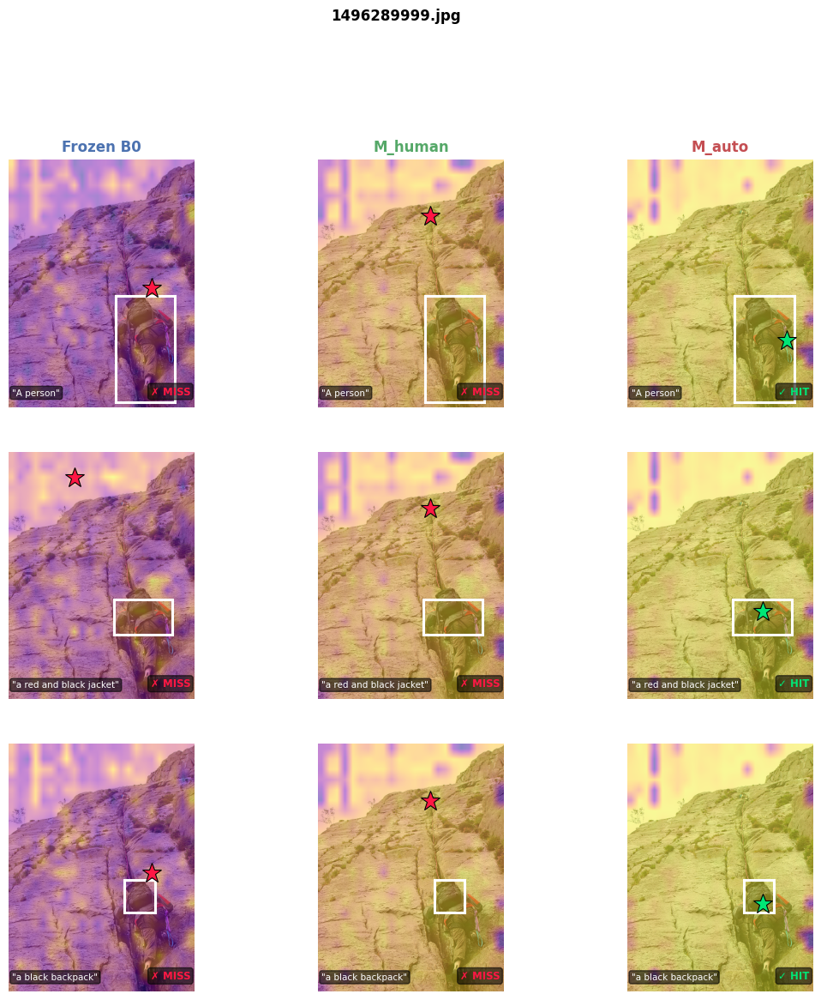

  Saved -> pg_viz_03_1496289999.png


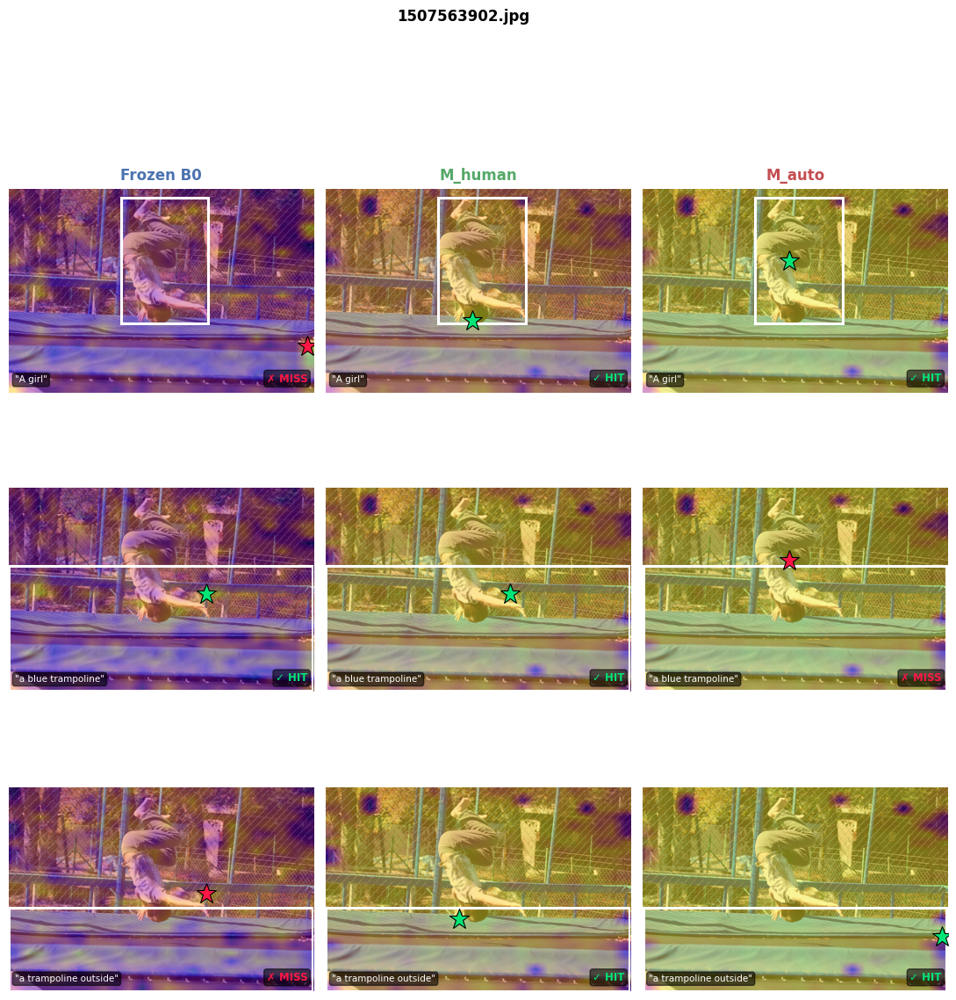

  Saved -> pg_viz_04_1507563902.png


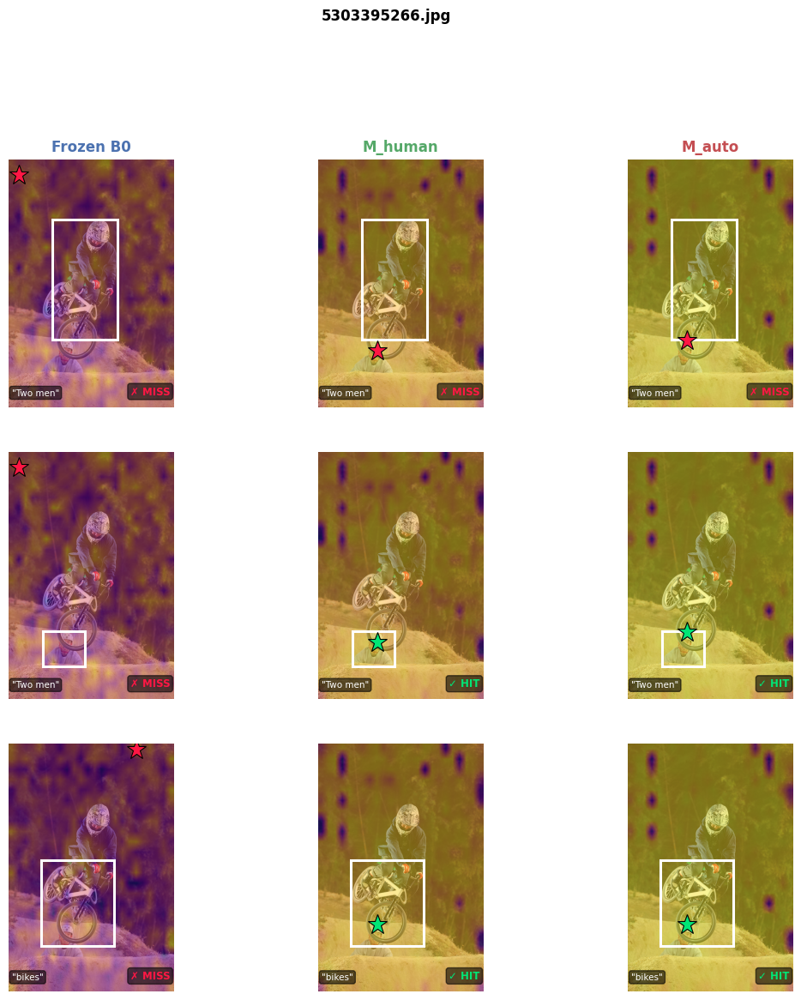

  Saved -> pg_viz_05_5303395266.png


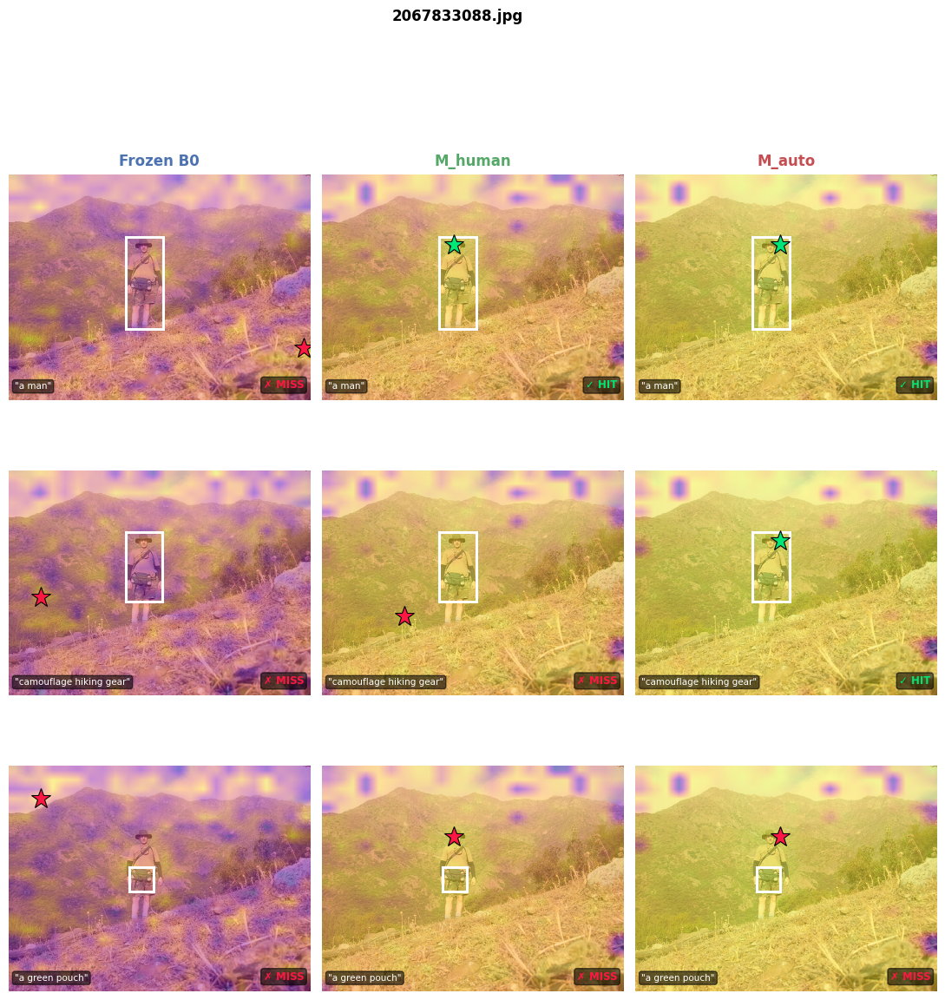

  Saved -> pg_viz_06_2067833088.png


In [13]:
# ── 6. Visualisation ──────────────────────────────────────────────────────────
# One figure per image. Rows = phrases (up to max_phrases). Cols = 3 models.

CMAP       = plt.cm.plasma
ALPHA_HEAT = 0.48
COL_W      = 4.6
ROW_H      = 4.2

for img_idx, (row, phrase_boxes) in enumerate(selected):
    pil     = get_pil(row)
    W, H    = pil.size
    img_arr = np.array(pil) / 255.0
    phrases = phrase_boxes[:CFG['max_phrases']]
    n_rows  = len(phrases)

    fig, axes = plt.subplots(
        n_rows, 3,
        figsize=(3 * COL_W, n_rows * ROW_H),
        squeeze=False,
        gridspec_kw={'wspace': 0.04, 'hspace': 0.18},
    )
    fig.suptitle(row['filename'], fontsize=12, fontweight='bold', y=1.02)

    for p_idx, (phrase, bbox) in enumerate(phrases):
        x1, y1, x2, y2 = bbox

        for m_idx, (model_name, model, label_color) in enumerate(MODELS):
            ax = axes[p_idx, m_idx]

            # similarity map
            _, sim_up, best_idx = get_sim_map(model, pil, phrase)
            cx, cy              = patch_to_px(best_idx, W, H)
            hit = (x1 <= cx <= x2) and (y1 <= cy <= y2)

            # blend heatmap over image
            s_min, s_max = sim_up.min(), sim_up.max()
            sim_norm = (sim_up - s_min) / (s_max - s_min + 1e-8)
            heat_rgb = CMAP(sim_norm)[..., :3]
            blended  = np.clip((1 - ALPHA_HEAT) * img_arr + ALPHA_HEAT * heat_rgb, 0, 1)
            ax.imshow(blended)

            # GT box (white)
            ax.add_patch(mpatches.Rectangle(
                (x1, y1), x2 - x1, y2 - y1,
                linewidth=2.2, edgecolor='white', facecolor='none', zorder=3,
            ))

            # argmax star
            star_c = '#00E676' if hit else '#FF1744'
            ax.plot(cx, cy, marker='*', markersize=17, color=star_c,
                    markeredgecolor='black', markeredgewidth=0.8, zorder=4)

            # column title (first row only)
            if p_idx == 0:
                ax.set_title(model_name, fontsize=12, fontweight='bold',
                             color=label_color, pad=7)

            # phrase label (bottom-left)
            short = phrase if len(phrase) <= 38 else phrase[:36] + '\u2026'
            ax.text(0.02, 0.04, f'"{short}"',
                    transform=ax.transAxes, fontsize=7.5,
                    color='white', va='bottom', ha='left', zorder=5,
                    bbox=dict(facecolor='black', alpha=0.58, pad=2.5,
                              boxstyle='round,pad=0.25'))

            # hit/miss badge (bottom-right)
            badge = '\u2713 HIT' if hit else '\u2717 MISS'
            ax.text(0.98, 0.04, badge,
                    transform=ax.transAxes, fontsize=8.5,
                    color=star_c, va='bottom', ha='right',
                    fontweight='bold', zorder=5,
                    bbox=dict(facecolor='black', alpha=0.58, pad=2.5,
                              boxstyle='round,pad=0.25'))

            ax.set_xticks([]); ax.set_yticks([])
            for spine in ax.spines.values():
                spine.set_visible(False)

    fname    = row['filename'].replace('.jpg', '')
    out_path = OUT_DIR / f'pg_viz_{img_idx + 1:02d}_{fname}.png'
    fig.savefig(out_path, dpi=130, bbox_inches='tight')
    plt.show()
    print(f'  Saved -> {out_path.name}')

In [14]:
# ── 7. Summary table — PG on all phrases in the 6 images ──────────────────────

print(f'{"Model":<14}  {"Hits":>5} / {"Total":<6}  {"Acc":>7}')
print('-' * 40)

for model_name, model, _ in MODELS:
    hits = total = 0
    for row, _ in selected:
        pil = get_pil(row)
        W, H = pil.size
        for phrase, bbox in load_phrase_boxes(row):
            x1, y1, x2, y2 = bbox
            if x2 <= x1 or y2 <= y1:
                continue
            _, _, best_idx = get_sim_map(model, pil, phrase)
            cx, cy = patch_to_px(best_idx, W, H)
            hits  += int((x1 <= cx <= x2) and (y1 <= cy <= y2))
            total += 1
    acc = 100.0 * hits / max(total, 1)
    print(f'{model_name:<14}  {hits:>5} / {total:<6}  {acc:>6.1f}%')

Model            Hits / Total       Acc
----------------------------------------
Frozen B0           5 / 38        13.2%
M_human            24 / 38        63.2%
M_auto             24 / 38        63.2%
